<a href="https://colab.research.google.com/github/Bhandari007/sequence_model_course/blob/main/W3A2_trigger_word_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/chime_output.wav?raw=true
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/chime_output.wav?raw=true
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/insert_test.wav?raw=true
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/raw_data.zip?raw=true
!wget https://raw.githubusercontent.com/abdur75648/Deep-Learning-Specialization-Coursera/main/Sequence%20Models/week3/w3a2/td_utils.py
!wget https://raw.githubusercontent.com/abdur75648/Deep-Learning-Specialization-Coursera/main/Sequence%20Models/week3/w3a2/test_utils.py
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/tmp.wav?raw=true
!wget https://raw.githubusercontent.com/abdur75648/Deep-Learning-Specialization-Coursera/main/Sequence%20Models/week3/w3a2/train.py
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/train.wav?raw=true
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/audio_examples/chime.wav?raw=true -P /audio_examples/
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/audio_examples/example_train.wav?raw=true -P/audio_examples/
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/audio_examples/insert_reference.wav?raw=true -P/audio_examples/
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/audio_examples/my_audio.wav?raw=true -P/audio_examples/
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/audio_examples/train_reference.wav?raw=true -P/audio_examples/
!wget https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/models/model.h5?raw=true -P/models/ 

--2022-10-22 04:20:21--  https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/blob/main/Sequence%20Models/week3/w3a2/chime_output.wav?raw=true
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/raw/main/Sequence%20Models/week3/w3a2/chime_output.wav [following]
--2022-10-22 04:20:21--  https://github.com/abdur75648/Deep-Learning-Specialization-Coursera/raw/main/Sequence%20Models/week3/w3a2/chime_output.wav
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/abdur75648/Deep-Learning-Specialization-Coursera/main/Sequence%20Models/week3/w3a2/chime_output.wav [following]
--2022-10-22 04:20:22--  https://raw.githubusercontent.com/abdur75648/Deep-Learning-Specialization-Coursera/main/Sequence%20Mo

In [2]:
import os
os.listdir("/audio_examples/"), os.listdir("/models/")

(['train_reference.wav?raw=true',
  'insert_reference.wav?raw=true',
  'my_audio.wav?raw=true',
  'example_train.wav?raw=true',
  'chime.wav?raw=true'],
 ['model.h5?raw=true'])

In [3]:
import zipfile
zip_ref = zipfile.ZipFile("./raw_data.zip?raw=true")
zip_ref.extractall()
zip_ref.close()

In [4]:
def clean_filename(directory):
  directory = "/audio_examples/"
  for old_filename in os.listdir(directory):
    new_filename = old_filename.split("?")[0]
    os.rename(os.path.join(directory, old_filename), os.path.join(directory,new_filename))
  print(os.listdir(directory))

In [5]:
clean_filename("/models/")

['chime.wav', 'train_reference.wav', 'insert_reference.wav', 'example_train.wav', 'my_audio.wav']


In [6]:
clean_filename("./")

['chime.wav', 'train_reference.wav', 'insert_reference.wav', 'example_train.wav', 'my_audio.wav']


# Trigger Word Detection

In this notebook, we will construct a speech dataset and implement an algorithm fro trigger word detection (sometimes also called keyword detection, or wake word detection).

* Trigger word detection is the technology that allows devices like Amazon Alexa, Google Home, Apple Siri, and Baidu DuerOS to wake upon hearing a certain word.
* For this project, our trigger word will be "activate". Every time it hears someone say "activate", it will make a "chimming" sound.
* By the end of this notebook, one will be able to record a clip of themselves talking, and have the algorithm trigger a chime when it detects saying "activate".

**Objectives:**

* To structure a speech recognition project
* Synthesize and process audio recordings to create train/dev datasets.
* Train a trigger word detection model and make predictions.

# Packages

In [7]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
import numpy as np
import random
from pydub import AudioSegment
import sys
import io
import os
import glob
import IPython
from td_utils import *
%matplotlib inline

# 1 - Data synthesis: Creating a Speech Dataset

Let's start by building a dataset for our trigger word detection algorithm.

* A speech dataset should really be as close as possible to the application we will want to run on it.
* In this case, we'd like to detect the word "activate" in working environment (library, home, offices, open-spaces..)
* Therefore, we need to create recordings with a mix of positive words ("activate") and negative words (random words other than activate) on different background sounds.


## 1.1 - Listening to the Data

* One of our friend is helping us out in this project, and they've gone to libraries, cafes, restaurants, homes and offices all around the region to record background noises, as well as snippets of audio of people saying positive/negative words. This dataset includes people speaking in a variety of accents.
* In the data directory, we can find a subest of the raw audio files of the positive words, negative words, and background noise. We will use these audio files to synthesive a dataset to train the model.
  * The "active" directory contains positive examples of people saying the word "activate".
  * The "negative" directory contains negative examples of people saying random words other than "activate".
  * There is one word per audio recording.
  * The "backgrounds" directory contains 10 second clips of background noise in different environments.

We will use three types of recordings (positives/negatives/backgrounds) to create a labeled dataset.

## 1.2 - From Audio Recordings to Spectrograms

Whar really is an audio recording?

* A microphone records little variations in air pressure over time, and its these little variations in air pressure that our ear also perceives as sound.
* We can think of an audio recording as long list of numbers measuring the little air pressure changes detected by the microphone.
* We will use audio samples at 44100Hx
  * This means the microphone gives us 44,100 numbers per second.
  * Thus, a 10 second audio clop is represented by 441,100 number

## Spectrogram

* It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said.
* In order to help our sequence model more easily to learn to detect trigger words, we will compute a spectrogram of the audio.
* The spectrogram tells us how much different frequencies are present in an audio clip at any moment in time.
* A spectrogram is computed by sliding window over the raw audio signal, and calculating the most active frequencis in each window using a Fourier transform.

An example of audio clip

In [9]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [10]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [11]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

In [12]:
IPython.display.Audio("./raw_data/dev/2.wav")

In [13]:
IPython.display.Audio("/audio_examples/example_train.wav")

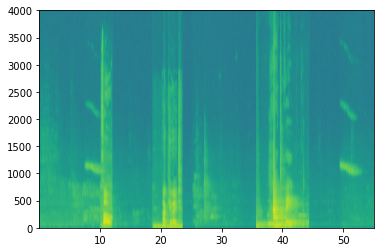

In [14]:
x = graph_spectrogram("/audio_examples/example_train.wav")

* The color in the spectrogram shows the degree to which different frequencies are present (loud) in the audio at different points in time.
* Green means a certain frequency is more active or more present in the audio clip (louder).
* Blue square denote less active frequencies.
* The dimension of the output spectorgam depends upon the hyperparameters of the spectogram software and the length of the input.
* In this notebook, we will be working with 10 second audio clips as the "standard length" for our training examples.
  * The number of timesteps of the spectorgam will be 5511.
  * We'll see later that the spectorgam will be the input *x* into the network, and so **Tx = 5511**



In [15]:
_, data = wavfile.read("/audio_examples/example_train.wav")
print(f"Time steps in audio recording before spectrogram", data[:,0].shape)
print(f"Time steps in input after spectrpgram",x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrpgram (101, 5511)


Now we can define:

In [16]:
Tx = 5511 # No of time steps input to the model from the spectrogram
n_freq = 101 # No of frequencies input to the model at each time step of the spectorgam

### Dividing into time-intervals

Note that we may divide a 10 second interval of time with different units (steps).

* Raw audio divides 10 seconds into 441,000 units.
* A spectrogram divides 10 second into 5511 units.
* We will use a Python module `pydub` to synthesie audio, and it divides 10 seconds to 10,000 units.
* The output of our model will divide 10 seconds into 1,375 units.
  * Ty = 1375
  * For each of the 1375 time steps, the model predicts whether someone recently finished saying the trigger word "activate".
* All of these are hyperparameters and can be changed.
* We have chosen values that are within the standard range used for speech systems.

In [17]:
Ty = 1375 # The number of time steps in the output of our model

## 1.3 - Generating a Single Training Examples

### Benefits of synthesizing data
Because speech data is hard to acquire and label, we will synthesize training data using the audio clips of activates, negatives and backgrounds.

* It is quite slow to record lots of 10 second audio clips with random "activates" in it.
* Instead, it is easier to record lots of positives and negative words, and record background noise separately

### Process to Sythensizing an audio clip
* To synthesize a single training example, we will:
  * Pick a random 10 second background audio clip
  * Randomly insert 0-4 audio clips of "activate" into this 10 sec. clip.
  * Randomly insert 0-2 audio clips of negative words into this 10 sec. clip.

* Because we had sythenize the word "activate" into the background clip, we know exactly when in the 10 second clip the "activate" makes it apperance.
  * This will make it easier to generate the labels *y<sup>t</sup>* as well.

### Pydub

* We will us the pydub package to manipulate audio.
* Pydub converts raw audio files into lists of Pydub data structures.
* Pydub uses 1ms as the discretization interval (1ms in 1 millisecond = 1/10000 seconds)
  * This is why a 10 second clip is always represented using 10,000 steps.



In [19]:
# Load audio segemnts using pydub
activates, negatives, backgrounds = load_raw_audio("./raw_data/")

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
1579 

activate[1] len: different `activate` clips can have different lengths
1741 



### Overlaying positive/negative 'word' audio clips on top of the background audio

* Given a 10 second background clip and a short audio clip containing a positive or negative word, we need to be able to "add" the word audio clip on top of the background audio.

* We will be inserting multiple clips of postive/negative words into the background, and we don't want to insert an "activate" or a random word somewhere that overlaps with another clip we have previously added.
  * To ensure that the "word" audio segements do not overlap when inserted, we will keep track fo the times of previously inserted audio clips.
* To be clear, when we insert a 1 second "activate" onto a 10 second clip of cafe noise, we do not end up with an 11 sec clip.
  * The resulting audio clip is still 10 seconds long.


### Label the positive/negative words

* The labels y(t) represent whether or not someone has just finished saying "activate".
  * y(t) = 1 when the clip has finished saying "activate".
  * Given a background clip, we can initialize y(t) = 0 for all t, since the clip doesnot contain any "activate".

* When we insert or overlay an "activate" clip, we will also update labels for y(t).
  * Rather than updating the label of a single time step, we will update 50 steps of the output to have target label 1.

* We will train a GRU (Gated Recurrent Unit) to detect when someone has **finished** saying "activate".

#### Example

* Suppose the synthesized "activate" clip ends at the 5 second mark in the 10 second audio exactly halfway into the clip.
* Since Ty = 1375, so timestep 688 = int(1375*0.5) corresponds to the 5 seconds into the audio clip.
* Set y(688) = 1.
* We will allow the GRU to detect "activate" anywhere within a short time-interval after this moment, so we actually set 50 consecutive values of the label y(t) to 1:
  * Specifically, we have y(688) = y(689) = ..... = y(737) = 1.

### Synthesized data is easier to label
* This is another reason for sythensizing the training data: It's relatively straightforward to generate these labels y(t).
* In contrast, if we have 10 sec of audio recorded on a microphone, it's quite time consuming for a person to listen to it and mark manually exactly when "activate" finished.


### Helper functions:
To implement the training set synthesis process, we will use the following helper functions.
  * All of these functions will use a 1ms discretization interval.
  * The 10 seconds of audio is always discretized into 10,000 steps.

  1. `get_random_time_segment(segment_ms)`
    * Retrives a random time segment from the background audio.
  2. `is_overlapping(segment_time, existing_segments)`
    * Checks if a time segment overlaps with existing segments.
  3. `insert_audio_clip(background, audio_clip, existing_times)`
    * Inserts an audio segement at a random time in the background audio.
    * Uses the functions `get_random_time_segment` and `is_overlapping`
  4. `insert_ones(y, segmenet_end_ms)`
    * Inserts additional 1's into the label vector y after the word "activate".

### Get a random time segment

* The function `get_random_time_segement(segment_ms)` returns a random time segment onto which we can insert an audio clip of duration `segment_ms`.

In [20]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

### Check if audio clips are overlapping
* Suppose we have inserted audio clips at segments (1000,1800) and (3400,4500).
  * The first segment starts at step 1000 and ends at step 1800
  * The second segment starts at 3400 and ends at 4500.
* If we are considering whether to insert a new audio clip at (3000,3600) does this overlap with one of the previously inserted segments?
  * In this case, (3000,3600) and (3400,4500) overlap, so we should decide against inserting a clip here.
* For this purpose of this function, define (100,200) and (200,250) to be overlapping, since they overlap at timestep 200.

* (100,199) and (200,250) are non-overlapping

In [21]:
def is_overlapping(segment_time, previous_segment):
  """
  Checks if the time of a segment overlaps with the times of existing segments.

  Arguments:
  segment_time -- a tuple of (segment_start, segment_end) for the new segment.
  previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments

  Returns:
  True if the time segment overlaps with any of the existing segemnts, False otherwise
  """
  segment_start, segment_end = segment_time

  overlap = False

  for previous_start, previous_end in previous_segment:
    if segment_start <= previous_end and segment_end >= previous_start:
      overlap = True
      break
  
  return overlap

In [22]:
# UNIT TEST
def is_overlapping_test(target):
    assert target((670, 1430), []) == False, "Overlap with an empty list must be False"
    assert target((500, 1000), [(100, 499), (1001, 1100)]) == False, "Almost overlap, but still False"
    assert target((750, 1250), [(100, 750), (1001, 1100)]) == True, "Must overlap with the end of first segment"
    assert target((750, 1250), [(300, 600), (1250, 1500)]) == True, "Must overlap with the begining of second segment"
    assert target((750, 1250), [(300, 600), (600, 1500), (1600, 1800)]) == True, "Is contained in second segment"
    print("\033[92m All tests passed!")
    
is_overlapping_test(is_overlapping)

 All tests passed!


In [23]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


### Insert audio clip

* Now, we will use the previous helper functions to insert a new audio clip onto the 10 second background at a random time.
* We have to ensure that any newly inserted segment doesn't overlap with previously inserted segments.

We will implement the function `insert_audio_clip()` in 4 steps:

1. Get the length of the audio clip that is to be inserted

2. Make sure that the time segment does not overlap with any of the previous time segments.

3. Append the new time segement to the list of existing time segements.

4. Overlay the audio clip over the background using pydub.

In [24]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    
    ### START CODE HERE ### 
    # Step 1: Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip. (≈ 1 line)
    segment_time = get_random_time_segment(segment_ms)
    
    # Step 2: Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap. To avoid an endless loop
    # we retry 5 times(≈ 2 lines)
    retry = 5 
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
    ### END CODE HERE ###

    # if last try is not overlaping, insert it to the background
    if not is_overlapping(segment_time, previous_segments):
    ### START CODE HERE ### 
        # Step 3: Append the new segment_time to the list of previous_segments (≈ 1 line)
        previous_segments.append(segment_time)
    ### END CODE HERE ###
        # Step 4: Superpose audio segment and background
        new_background = background.overlay(audio_clip, position = segment_time[0])
        print(segment_time)
    else:
        print("Timeouted")
        new_background = background
        segment_time = (10000, 10000)
    
    return new_background, segment_time

In [25]:
# UNIT TEST
def insert_audio_clip_test(target):
    np.random.seed(5)
    audio_clip, segment_time = target(backgrounds[0], activates[0], [(0, 4400)])
    duration = segment_time[1] - segment_time[0]
    assert segment_time[0] > 4400, "Error: The audio clip is overlaping with the first segment"
    assert duration + 1 == len(activates[0]) , "The segment length must match the audio clip length"
    assert audio_clip != backgrounds[0] , "The audio clip must be different than the pure background"
    
    # Not possible to insert clip into background
    audio_clip, segment_time = target(backgrounds[0], activates[0], [(0, 9999)])
    assert segment_time[0] == 10000 and segment_time[1] == 10000, "Segment must match the out by max-retry mark"
    assert audio_clip == backgrounds[0], "output audio clip must be exactly the same input background"

    print("\033[92m All tests passed!")

insert_audio_clip_test(insert_audio_clip)

(7286, 8864)
Timeouted
 All tests passed!


In [26]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

(7286, 8864)
Segment Time:  (7286, 8864)


### Insert ones for the labels of the positive target

* Implement code to update the labels y(t), assuming we just inserted an "activate" audio clip.
* If the "activate" audio clip ends at time step *t*, then set y(t+1) = 1 and also set the next 49 additional consecutive values to 1.

We can implement `insert_ones()`.

* We can use a for loop.
* If we want to use Python's array slicing operations, we can do so as well.
* If a segement ends at `segement_end_ms:
  * To convert it to the indexing for the outputs *y*, we will use this formula:
    segment_end_y = int(segment_end_ms * Ty / 10000.0)

In [28]:
def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 following labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    _, Ty = y.shape
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    if segment_end_y < Ty:
        # Add 1 to the correct index in the background label (y)
        ### START CODE HERE ### (≈ 3 lines)
        for i in range(segment_end_y+1, segment_end_y+51):
            if i < Ty:
                y[0, i] = 1
        ### END CODE HERE ###
    
    return y

In [29]:
# UNIT TEST
import random
def insert_ones_test(target):
    segment_end_y = random.randrange(0, Ty - 50) 
    segment_end_ms = int(segment_end_y * 10000.4) / Ty;    
    arr1 = target(np.zeros((1, Ty)), segment_end_ms)

    assert type(arr1) == np.ndarray, "Wrong type. Output must be a numpy array"
    assert arr1.shape == (1, Ty), "Wrong shape. It must match the input shape"
    assert np.sum(arr1) == 50, "It must insert exactly 50 ones"
    assert arr1[0][segment_end_y - 1] == 0, f"Array at {segment_end_y - 1} must be 0"
    assert arr1[0][segment_end_y] == 0, f"Array at {segment_end_y} must be 1"
    assert arr1[0][segment_end_y + 1] == 1, f"Array at {segment_end_y + 1} must be 1"
    assert arr1[0][segment_end_y + 50] == 1, f"Array at {segment_end_y + 50} must be 1"
    assert arr1[0][segment_end_y + 51] == 0, f"Array at {segment_end_y + 51} must be 0"

    print("\033[92m All tests passed!")
    
insert_ones_test(insert_ones)

 All tests passed!


sanity checks: 0.0 1.0 0.0


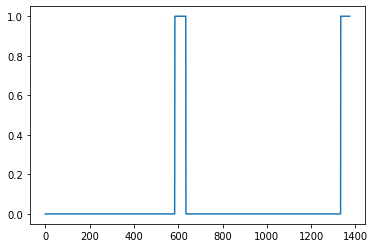

In [30]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

### Creating a training example
Finally, we can use `insert_audio_clip` and `insert_ones` to create a new trainig example.

We can implement the function following steps:

1. Initialize the label vector *y* as a numpy array of zeros and shape (1,Ty).
2. Initialize the set of existing segments to an empty list.
3. Randomly select 0 to 4 "activate" audio clips, and insert them onto the 10 second clip. Also inserts at the correct position in the label vector *y*.
4. Randomly select 0 to 2 negative audio clips, and insert them into 10 second clip.

In [31]:
def create_training_example(background, activates, negatives, Ty):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    Ty -- The number of time steps in the output

    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((1, Ty))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    ### END CODE HERE ###
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    ### START CODE HERE ### (≈ 3 lines)
    # Step 3: Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y" at segment_end
        y = insert_ones(y, segment_end)
    ### END CODE HERE ###

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    ### START CODE HERE ### (≈ 2 lines)
    # Step 4: Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    ### END CODE HERE ###
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    # file_handle = background.export("train" + ".wav", format="wav")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y


(2885, 3609)
(1726, 2380)
(6882, 7236)
 All tests passed!


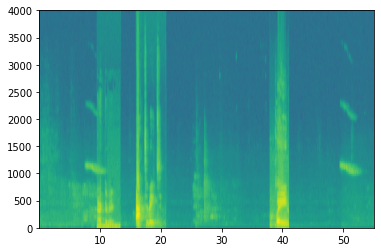

In [33]:
# UNIT TEST
def create_training_example_test(target):
    np.random.seed(18)
    x, y = target(backgrounds[0], activates, negatives, 1375)
    
    assert type(x) == np.ndarray, "Wrong type for x"
    assert type(y) == np.ndarray, "Wrong type for y"
    assert tuple(x.shape) == (101, 5511), "Wrong shape for x"
    assert tuple(y.shape) == (1, 1375), "Wrong shape for y"
    assert np.all(x > 0), "All x values must be higher than 0"
    assert np.all(y >= 0), "All y values must be higher or equal than 0"
    assert np.all(y < 51), "All y values must be smaller than 51"
    assert np.sum(y) % 50 == 0, "Sum of activate marks must be a multiple of 50"
    assert np.isclose(np.linalg.norm(x), 39745552.52075), "Spectrogram is wrong. Check the parameters passed to the insert_audio_clip function"
    print("\033[92m All tests passed!")
create_training_example_test(create_training_example)

(2885, 3609)
(1726, 2380)
(6882, 7236)


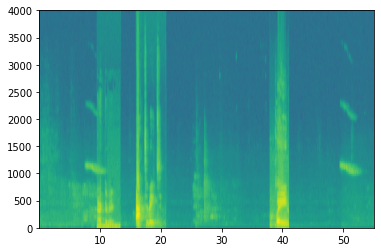

In [34]:
# Set the random seed
np.random.seed(18)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

In [35]:
IPython.display.Audio("train.wav")

Finally, we can plot the associated labels for the generated training example.

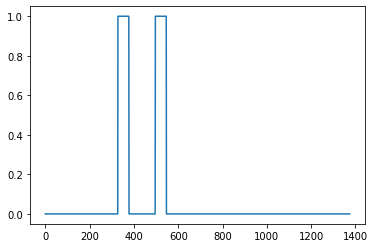

In [36]:
plt.plot(y[0])

### 1.4 - Full Training Set

* We've now implemented the code needed to generate a single traning example.
* We used this process tot generate a large training set.
* To save time, we generate a smaller training set of 32 examples.

0
(5817, 6725)
(9054, 9774)
(743, 1100)
(2724, 3323)
(3172, 3578)
(5426, 6334)
(2047, 2714)
(4470, 4824)
(4979, 5646)
(7979, 9557)
(6276, 7006)
(857, 1435)
(3113, 3470)
(3774, 6165)
(1288, 2196)
(3704, 4619)
(5579, 7157)
(3905, 5483)
(1747, 2401)
(4272, 4871)
(6573, 7240)
(7249, 8827)
(1934, 2588)
(5326, 6046)
(4004, 4363)
(2734, 3642)
(3797, 4154)
10
(2369, 3093)
(1611, 1965)
(7377, 7731)
(1750, 2658)
(8759, 9426)
(3041, 3695)
(6853, 7393)
(7451, 9191)
(543, 2934)
(5838, 6746)
(2884, 3604)
(1642, 2048)
(2326, 2993)
(7830, 8560)
(5093, 5499)
(6266, 7844)
(236, 2627)
(3471, 4201)
Timeouted
(8859, 9513)
(7836, 8566)
(2254, 3162)
(3944, 5684)
(8843, 9497)
(90, 447)
(1378, 2293)
(7328, 8906)
(112, 1020)
(6579, 7157)
20
(7100, 7678)
(8605, 9259)
(8094, 8748)
(4776, 7167)
(2991, 3645)
(2250, 2974)
(1406, 1763)
(8905, 9483)
(4064, 5642)
(776, 2516)
(7836, 8560)
(8847, 9206)
(3445, 3804)
(9220, 9950)
(2713, 3380)
(7089, 7443)
(3592, 5170)
(648, 2226)
(6336, 8727)
(2243, 2963)
Timeouted
(8795, 

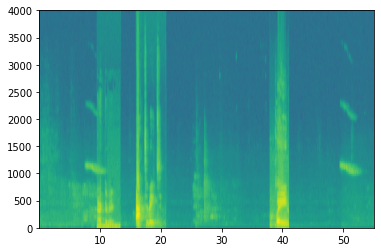

In [37]:
# START SKIP FOR GRADING
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)
# END SKIP FOR GRADING

In [39]:
# # Save the data for further uses
# np.save(f'./XY_train/X.npy', X)
# np.save(f'./XY_train/Y.npy', Y)
# # Load the preprocessed training examples
# X = np.load("./XY_train/X.npy")
# Y = np.load("./XY_train/Y.npy")

### 1.5 - Development Set

* To test our model, we recorded a development set of 25 examples.
* While our training data is synthesized, we want to create a development set using the same distribution as the real inputs.
* Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand.


# 2 - The Model

* Now that we've built a datset, let's write and train a trigger word detection model
* The model will use 1-D convolution layers, GRU layers and dense layers.

In [40]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

## 2.1 - Build the Model

Our goal is to build a network that will ingest a spectrogram and output a signal when it detects the trigger word. This network will use 4 layers:

* A convolution layer
* Two GRU layers
* A dense layers.